In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
pd.set_option('display.max_columns', None)
import statsmodels.api as sm
from collections import Counter
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier, ExtraTreesClassifier
from sklearn.ensemble import AdaBoostRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, classification_report, f1_score, roc_auc_score, accuracy_score, roc_curve, auc
import pickle
import warnings
warnings.filterwarnings('ignore')


In [2]:
data = pd.read_csv("Rainfall Weather Forecasting.csv")

# Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow.

# EDA

In [3]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [5]:
data.shape

(8425, 23)

In [6]:
data.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [7]:
data.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In [8]:
data.dtypes

Date              object
Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

In [9]:
data.dtypes.value_counts()

float64    16
object      7
dtype: int64

In [10]:
data=data.drop_duplicates()

In [11]:
data.shape

(6762, 23)

1663 duplicate values were present in the dataset

In [12]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,6692.0,13.109145,5.569574,-2.0,9.0,13.2,17.5,28.5
MaxTemp,6705.0,24.098345,6.156128,8.2,19.5,23.5,28.4,45.5
Rainfall,6624.0,2.780148,10.591418,0.0,0.0,0.0,0.8,371.0
Evaporation,3841.0,5.302395,4.436790,0.0,2.6,4.6,7.0,145.0
Sunshine,3526.0,7.890896,3.785883,0.0,5.4,9.0,10.8,13.9
WindGustSpeed,5820.0,38.977663,14.418577,7.0,30.0,37.0,48.0,107.0
WindSpeed9am,6699.0,12.782206,9.833499,0.0,6.0,11.0,19.0,63.0
WindSpeed3pm,6662.0,17.571150,9.620043,0.0,9.0,17.0,24.0,83.0
Humidity9am,6708.0,67.506559,17.251733,10.0,56.0,68.0,81.0,100.0
Humidity3pm,6666.0,50.467147,18.631086,6.0,38.0,50.0,63.0,99.0


In [13]:
for i in data.columns:
        print(data[i].value_counts())

2011-02-11    4
2011-02-18    4
2011-03-18    4
2011-03-19    4
2011-03-20    4
             ..
2016-11-03    1
2016-11-02    1
2016-11-01    1
2016-10-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
PerthAirport    1204
Albury           907
Newcastle        822
Melbourne        811
Williamtown      615
CoffsHarbour     611
Brisbane         579
Penrith          482
Darwin           250
Wollongong       237
Adelaide         205
Uluru             39
Name: Location, dtype: int64
13.2    58
12.0    57
14.8    53
12.7    53
10.8    52
        ..
26.6     1
28.0     1
26.9     1
1.4      1
26.0     1
Name: MinTemp, Length: 285, dtype: int64
19.0    66
19.8    62
20.8    54
23.8    54
25.0    54
        ..
38.9     1
10.3     1
9.4      1
42.5     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64
0.0      4334
0.2       321
0.4       144
0.6        87
1.2        69
         ... 
73.8        1
23.8        1
61.2        1
128.0       1
40.0        1
Name: Rainfall, Length: 25

In [14]:
#conversion of date from object type to date type and then seperate day, month and year
data['Date']=pd.to_datetime(data['Date'])
data["Day"] = data['Date'].dt.day
data["Month"] = data['Date'].dt.month
data["Year"] = data['Date'].dt.year

In [15]:
data.drop("Date",axis=1,inplace=True)

In [16]:
data.isnull().sum()

Location            0
MinTemp            70
MaxTemp            57
Rainfall          138
Evaporation      2921
Sunshine         3236
WindGustDir       942
WindGustSpeed     942
WindDir9am        794
WindDir3pm        294
WindSpeed9am       63
WindSpeed3pm      100
Humidity9am        54
Humidity3pm        96
Pressure9am      1308
Pressure3pm      1311
Cloud9am         1866
Cloud3pm         1902
Temp9am            51
Temp3pm            92
RainToday         138
RainTomorrow      138
Day                 0
Month               0
Year                0
dtype: int64

In [17]:
#Separation of Numerical and Categorical columns
categorical_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]=='object':
        categorical_col.append(i)
print("Categorical columns are:\n",categorical_col)
print("\n")

numerical_col=[]
for i in data.dtypes.index:
    if data.dtypes[i]!='object':
        numerical_col.append(i)
print("Numerical columns are:\n",numerical_col)

Categorical columns are:
 ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


Numerical columns are:
 ['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


In [18]:
# Replacing NAN values in the categorical columns by MODE 

df=pd.DataFrame()
df['WindGustDir'] = data['WindGustDir'].fillna(data['WindGustDir'].mode()[0])
df['WindDir9am'] = data['WindDir9am'].fillna(data['WindDir9am'].mode()[0])
df['WindDir3pm'] = data['WindDir3pm'].fillna(data['WindDir3pm'].mode()[0])
df['RainToday'] = data['RainToday'].fillna(data['RainToday'].mode()[0])
df['RainTomorrow']=data['RainTomorrow'].fillna(data['RainTomorrow'].mode()[0])
df['Location']=data['Location']

In [19]:
df.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location
0,W,W,WNW,No,No,Albury
1,WNW,NNW,WSW,No,No,Albury
2,WSW,W,WSW,No,No,Albury
3,NE,SE,E,No,No,Albury
4,W,ENE,NW,No,No,Albury


In [20]:
df.tail()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location
8420,E,SE,ENE,No,No,Uluru
8421,NNW,SE,N,No,No,Uluru
8422,N,SE,WNW,No,No,Uluru
8423,SE,SSE,N,No,No,Uluru
8424,E,ESE,ESE,No,No,Uluru


In [21]:
Iimputer=IterativeImputer()
befor_imp=pd.DataFrame(data[numerical_col])

In [22]:
df1=pd.DataFrame(Iimputer.fit_transform(befor_imp),columns=numerical_col)
df1

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,13.4,22.900000,0.6,3.391685,7.130509,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.874826,16.9,21.8,1.0,12.0,2008.0
1,7.4,25.100000,0.0,4.149341,12.628322,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.135447,1.451345,17.2,24.3,2.0,12.0,2008.0
2,12.9,25.700000,0.0,5.872974,12.022633,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.268447,2.000000,21.0,23.2,3.0,12.0,2008.0
3,9.2,28.000000,0.0,3.771469,13.091641,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.505052,0.825362,18.1,26.5,4.0,12.0,2008.0
4,17.5,32.300000,1.0,3.909425,6.732299,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,2.8,23.400000,0.0,6.351080,11.113943,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.685550,1.589567,10.1,22.4,21.0,6.0,2017.0
6758,3.6,25.300000,0.0,6.025810,11.780452,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.577039,1.130006,10.9,24.5,22.0,6.0,2017.0
6759,5.4,26.900000,0.0,7.826086,11.551481,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,0.869720,1.639326,12.5,26.1,23.0,6.0,2017.0
6760,7.8,27.000000,0.0,8.048489,10.572988,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


In [23]:
df[numerical_col]=df1[numerical_col]

In [24]:
df.shape

(6762, 25)

In [25]:
df.isna().sum()

WindGustDir         0
WindDir9am          0
WindDir3pm          0
RainToday           0
RainTomorrow        0
Location            0
MinTemp          1663
MaxTemp          1663
Rainfall         1663
Evaporation      1663
Sunshine         1663
WindGustSpeed    1663
WindSpeed9am     1663
WindSpeed3pm     1663
Humidity9am      1663
Humidity3pm      1663
Pressure9am      1663
Pressure3pm      1663
Cloud9am         1663
Cloud3pm         1663
Temp9am          1663
Temp3pm          1663
Day              1663
Month            1663
Year             1663
dtype: int64

In [26]:
df.dropna(inplace=True)
df.shape

(5099, 25)

<AxesSubplot:>

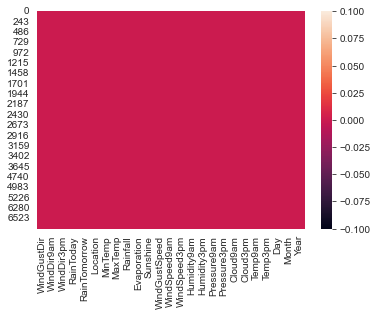

In [27]:
sns.heatmap(df.isna())

We can see that all null values have been removed.

In [28]:
categorical_col

['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',
 'RainToday',
 'RainTomorrow']

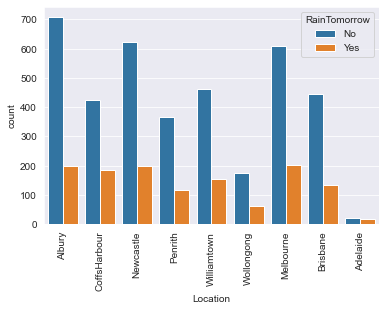

In [29]:
sns.countplot(df['Location'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

E      1143
N       372
SSE     364
W       333
S       326
WNW     322
SE      302
SW      287
WSW     261
NNE     239
NE      237
SSW     216
ENE     210
NW      195
ESE     162
NNW     130
Name: WindGustDir, dtype: int64


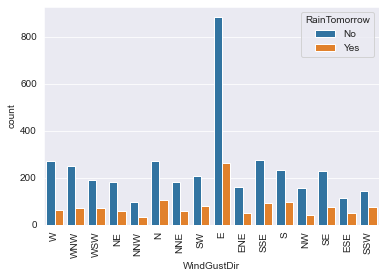

In [30]:
print(df['WindGustDir'].value_counts())
sns.countplot(df['WindGustDir'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

SE     910
S      443
NE     424
SSE    362
NW     304
N      285
WNW    279
ESE    276
ENE    256
E      252
W      252
NNE    245
WSW    237
SSW    214
SW     213
NNW    147
Name: WindDir3pm, dtype: int64


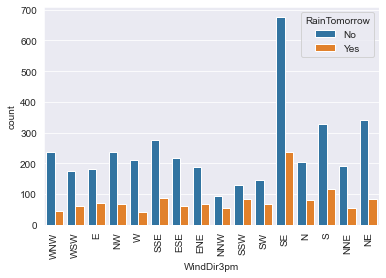

In [31]:
print(df['WindDir3pm'].value_counts())
sns.countplot(df['WindDir3pm'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

SE     910
S      443
NE     424
SSE    362
NW     304
N      285
WNW    279
ESE    276
ENE    256
E      252
W      252
NNE    245
WSW    237
SSW    214
SW     213
NNW    147
Name: WindDir3pm, dtype: int64


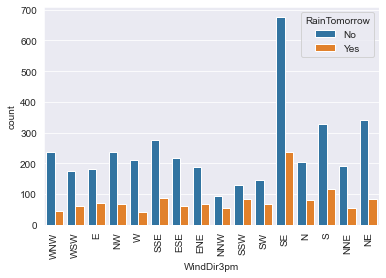

In [32]:
print(df['WindDir3pm'].value_counts())
sns.countplot(df['WindDir3pm'],hue=df['RainTomorrow'])
plt.xticks(rotation=90)
plt.show()

In [33]:
numerical_col

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm',
 'Day',
 'Month',
 'Year']

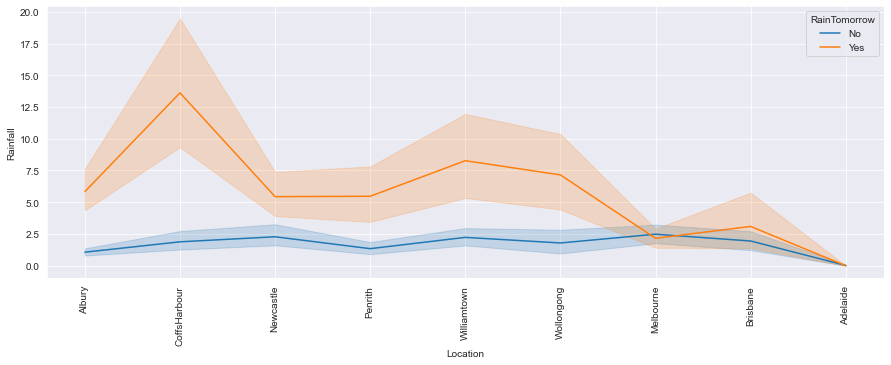

In [34]:
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.lineplot(df['Location'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()


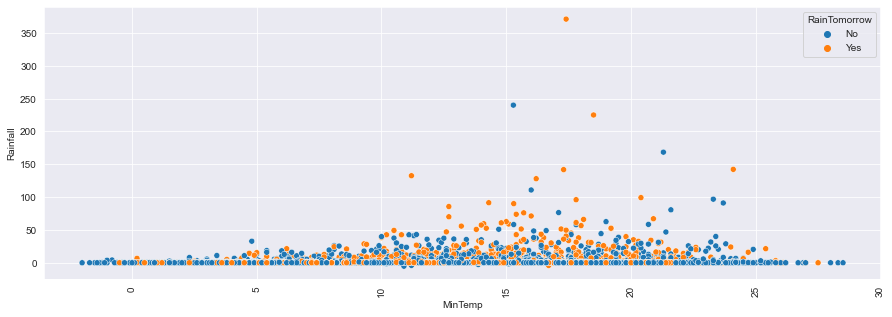

In [35]:
#Rainfall at minimum Temperature
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['MinTemp'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

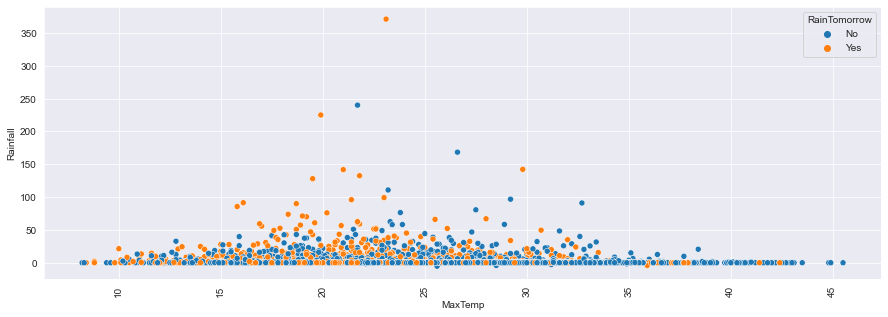

In [37]:
#Rainfall at Max Temperature
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['MaxTemp'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

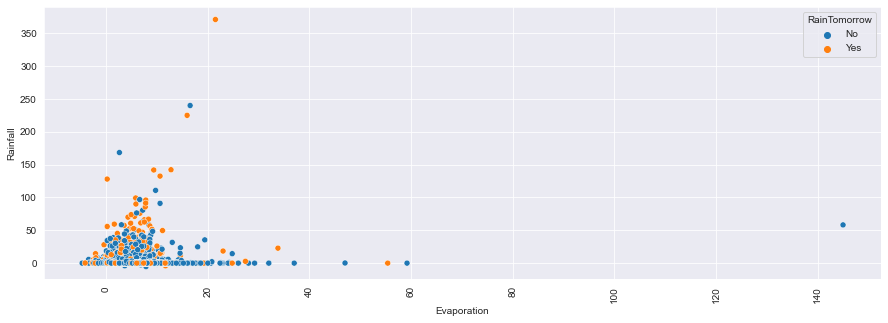

In [38]:
#rainfall at Evaporation
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['Evaporation'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

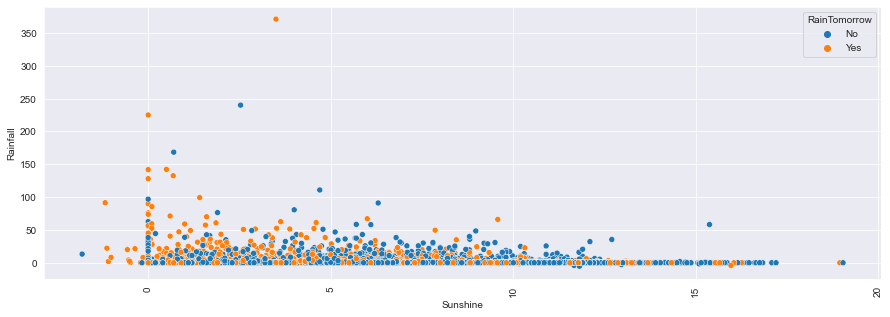

In [39]:
#Rainfall at Sunshine
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['Sunshine'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

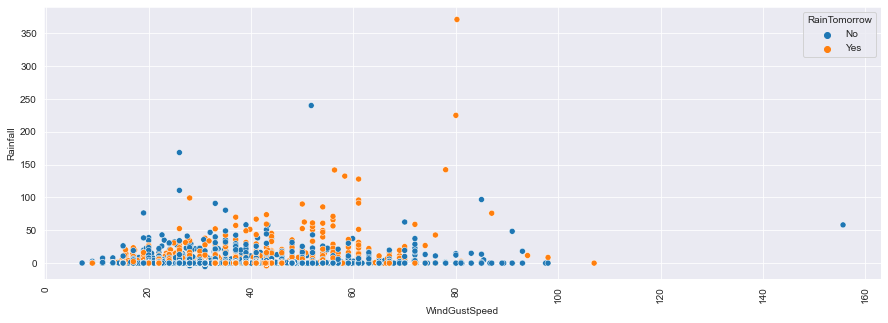

In [40]:
#Rainfall at WindGustSpeed
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['WindGustSpeed'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

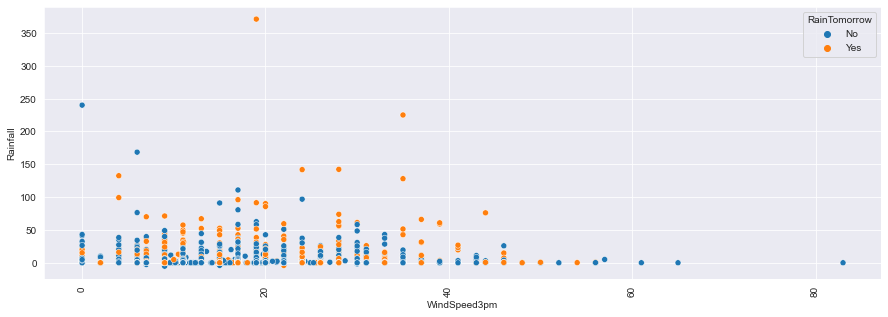

In [41]:
#Rainfall at Windspeed3pm
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['WindSpeed3pm'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

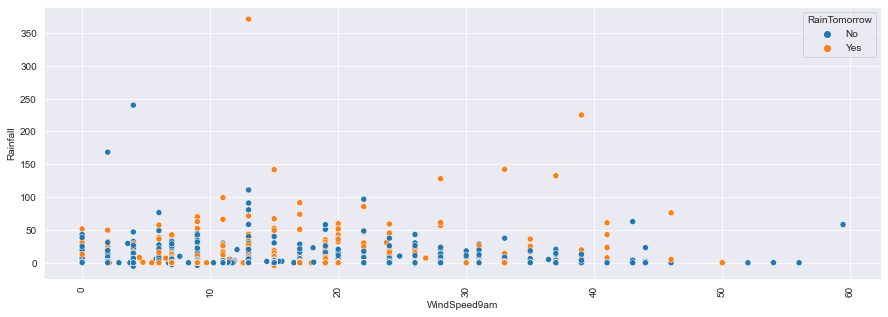

In [42]:
#Rainfall at WindSpeed9am
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['WindSpeed9am'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

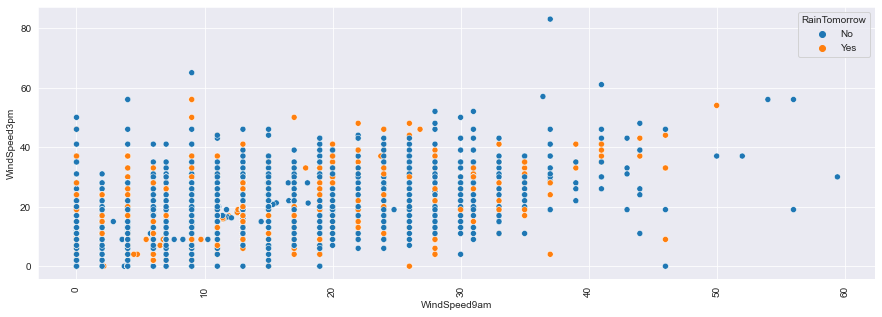

In [43]:
#Relation between windspeed9am and windspeed3pm
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['WindSpeed9am'],df['WindSpeed3pm'],hue=df['RainTomorrow'])
plt.show()

There is Linear relation between windspeed9am and windspeed3pm

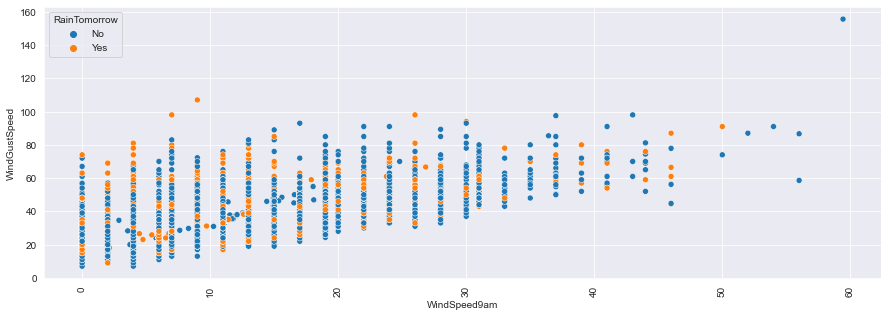

In [44]:
#Windgustspeed at WindSpeed9am
plt.figure(figsize=(15,5))
plt.xticks(rotation=90)
sns.scatterplot(df['WindSpeed9am'],df['WindGustSpeed'],hue=df['RainTomorrow'])
plt.show()

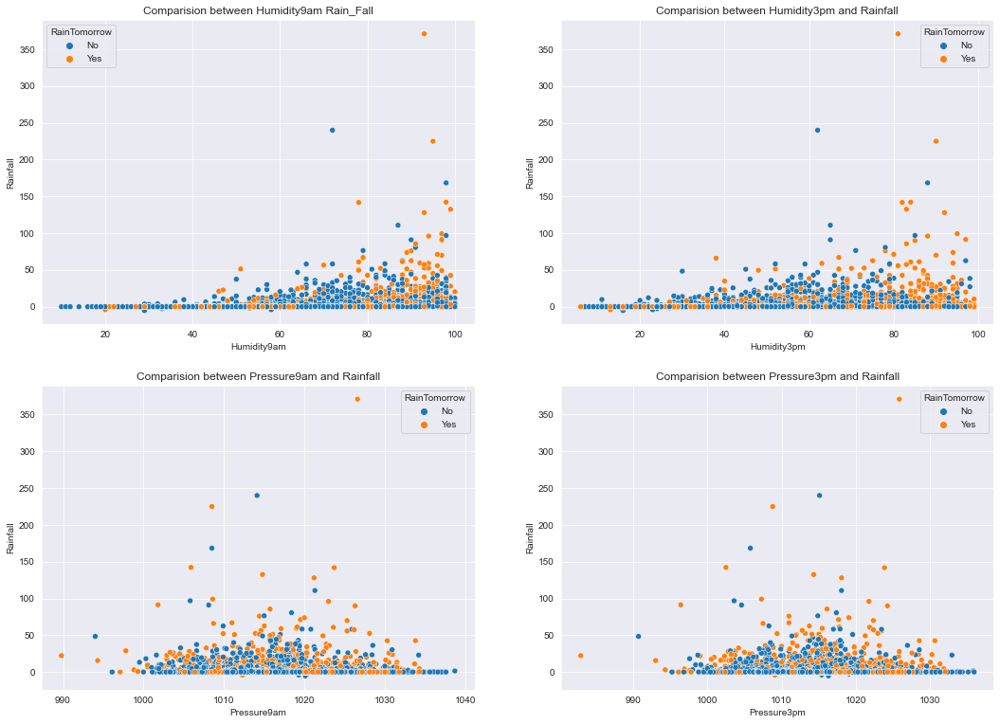

In [45]:
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between Humidity9am Rain_Fall')
sns.scatterplot(df['Humidity9am'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,2)
plt.title('Comparision between Humidity3pm and Rainfall')
sns.scatterplot(df['Humidity3pm'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,3)
plt.title('Comparision between Pressure9am and Rainfall')
sns.scatterplot(df['Pressure9am'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,4)
plt.title('Comparision between Pressure3pm and Rainfall')
sns.scatterplot(df['Pressure3pm'],df['Rainfall'],hue=df['RainTomorrow'])
plt.show()

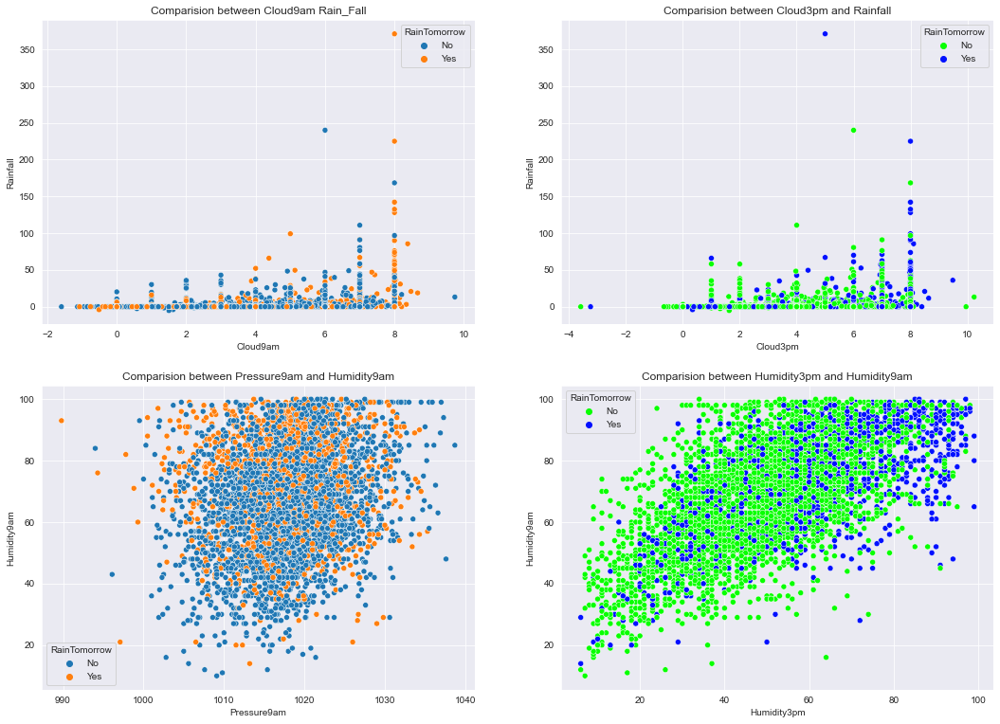

In [46]:
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between Cloud9am Rain_Fall')
sns.scatterplot(df['Cloud9am'],df['Rainfall'],hue=df['RainTomorrow'])

plt.subplot(2,2,2)
plt.title('Comparision between Cloud3pm and Rainfall')
sns.scatterplot(df['Cloud3pm'],df['Rainfall'],hue=df['RainTomorrow'],palette='hsv')

plt.subplot(2,2,3)
plt.title('Comparision between Pressure9am and Humidity9am')
sns.scatterplot(df['Pressure9am'],df['Humidity9am'],hue=df['RainTomorrow'])

plt.subplot(2,2,4)
plt.title('Comparision between Humidity3pm and Humidity9am')
sns.scatterplot(df['Humidity3pm'],df['Humidity9am'],hue=df['RainTomorrow'],palette='hsv')
plt.show()

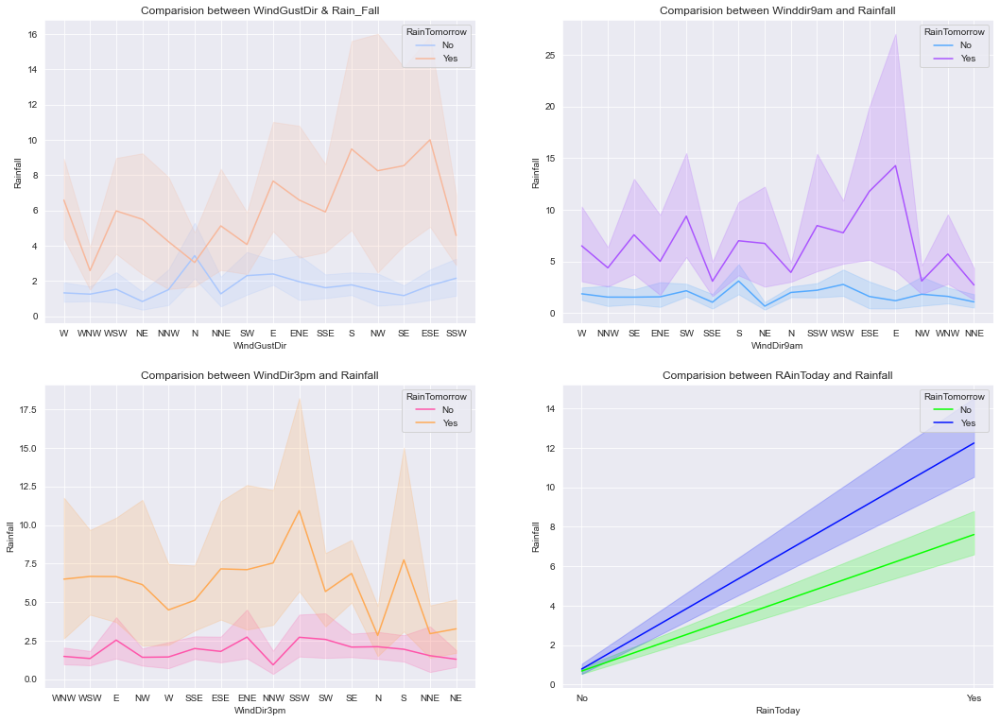

In [47]:
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between WindGustDir & Rain_Fall')
sns.lineplot(df['WindGustDir'],df['Rainfall'],hue=df['RainTomorrow'],palette='coolwarm')

plt.subplot(2,2,2)
plt.title('Comparision between Winddir9am and Rainfall')
sns.lineplot(df['WindDir9am'],df['Rainfall'],hue=df['RainTomorrow'],palette='cool')

plt.subplot(2,2,3)
plt.title('Comparision between WindDir3pm and Rainfall')
sns.lineplot(df['WindDir3pm'],df['Rainfall'],hue=df['RainTomorrow'],palette='spring')

plt.subplot(2,2,4)
plt.title('Comparision between RAinToday and Rainfall')
sns.lineplot(df['RainToday'],df['Rainfall'],hue=df['RainTomorrow'],palette='hsv')
plt.show()


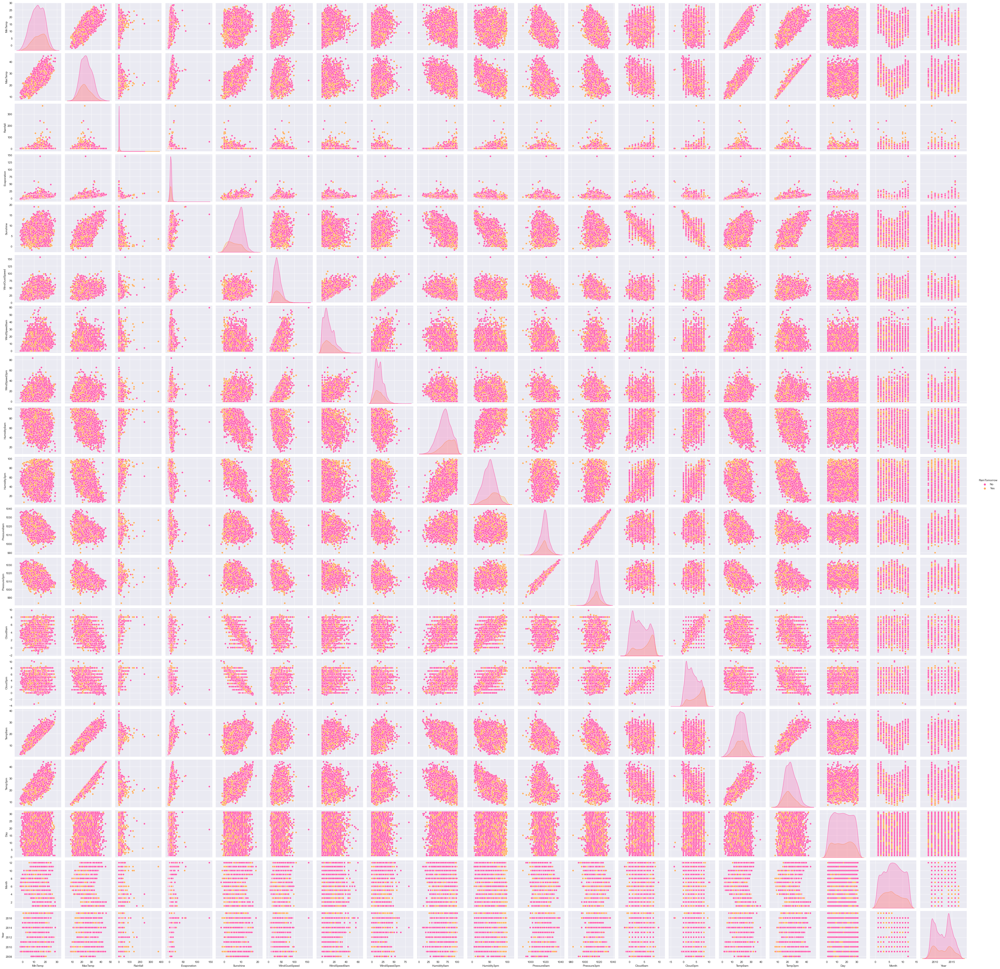

In [48]:
sns.pairplot(df,palette='spring',hue='RainTomorrow')
plt.show()

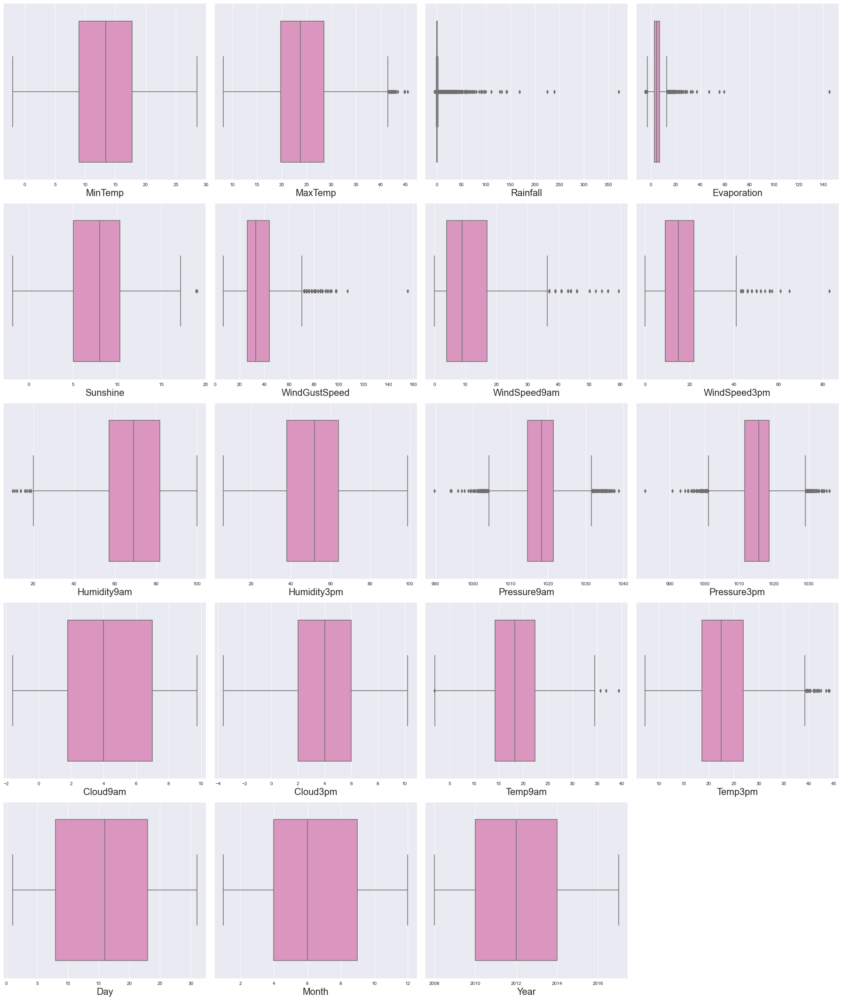

In [49]:
#checking the outliers 

plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.boxplot(df[column],palette="Set2_r")
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()

In [50]:
features=df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

# Using zscore to remove outliers
from scipy.stats import zscore

z=np.abs(zscore(features))

z 


,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Pressure9am,Pressure3pm,Temp9am,Temp3pm
0,0.229987,0.205244,0.398878,0.143002,0.585970,1.015416,0.813279,0.128103,1.766860,1.411133,0.215139,0.187819
1,0.134071,0.257142,0.215776,1.408207,0.585970,0.780844,0.602789,1.443096,1.265458,1.289729,0.162886,0.236069
2,0.233360,0.257142,0.200773,1.237311,0.728578,0.903150,1.023769,1.792251,1.784150,1.133638,0.498993,0.049559
3,0.613966,0.257142,0.307096,1.538932,0.840108,0.005020,0.765395,1.384903,0.055177,0.422557,0.006125,0.609090
4,1.325534,0.170645,0.273756,0.255357,0.372059,0.444045,0.392299,0.768221,1.230878,1.601911,0.058379,1.151667
...,...,...,...,...,...,...,...,...,...,...,...,...
6757,0.147247,0.257142,0.316316,0.980924,0.340981,0.229553,0.554905,1.035748,1.155104,0.878200,1.399554,0.086085
6758,0.167167,0.257142,0.237709,1.168980,0.982716,0.229553,0.765395,0.744785,0.964917,0.670079,1.260211,0.269980
6759,0.431937,0.257142,0.672780,1.104376,0.086843,0.219512,0.765395,0.919363,0.532674,0.271180,0.981525,0.541268
6760,0.448485,0.257142,0.726528,0.828294,0.554892,0.229553,0.975885,1.035748,0.256038,0.219150,0.528661,0.524313


In [51]:
dataloss=(5099-4839)/5099
dataloss*100

5.099039027260247

In [53]:
new_df = df[(z<3).all(axis=1)] 
new_df

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,W,W,WNW,No,No,Albury,13.4,22.900000,0.6,3.391685,7.130509,44.000000,20.0,24.0,71.0,22.0,1007.7,1007.1,8.000000,4.874826,16.9,21.8,1.0,12.0,2008.0
1,WNW,NNW,WSW,No,No,Albury,7.4,25.100000,0.0,4.149341,12.628322,44.000000,4.0,22.0,44.0,25.0,1010.6,1007.8,1.135447,1.451345,17.2,24.3,2.0,12.0,2008.0
2,WSW,W,WSW,No,No,Albury,12.9,25.700000,0.0,5.872974,12.022633,46.000000,19.0,26.0,38.0,30.0,1007.6,1008.7,2.268447,2.000000,21.0,23.2,3.0,12.0,2008.0
3,NE,SE,E,No,No,Albury,9.2,28.000000,0.0,3.771469,13.091641,24.000000,11.0,9.0,45.0,16.0,1017.6,1012.8,0.505052,0.825362,18.1,26.5,4.0,12.0,2008.0
4,W,ENE,NW,No,No,Albury,17.5,32.300000,1.0,3.909425,6.732299,41.000000,7.0,20.0,82.0,33.0,1010.8,1006.0,7.000000,8.000000,17.8,29.7,5.0,12.0,2008.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6757,N,N,N,No,No,Adelaide,2.8,23.400000,0.0,6.351080,11.113943,31.000000,13.0,11.0,51.0,24.0,1024.6,1020.3,0.685550,1.589567,10.1,22.4,21.0,6.0,2017.0
6758,WNW,NNE,N,No,Yes,Adelaide,3.6,25.300000,0.0,6.025810,11.780452,22.000000,13.0,9.0,56.0,21.0,1023.5,1019.1,0.577039,1.130006,10.9,24.5,22.0,6.0,2017.0
6759,WSW,SSW,SW,Yes,Yes,Adelaide,5.4,26.900000,0.0,7.826086,11.551481,37.000000,9.0,9.0,53.0,24.0,1021.0,1016.8,0.869720,1.639326,12.5,26.1,23.0,6.0,2017.0
6760,WSW,S,W,Yes,No,Adelaide,7.8,27.000000,0.0,8.048489,10.572988,28.000000,13.0,7.0,51.0,24.0,1019.4,1016.5,3.000000,2.000000,15.1,26.0,24.0,6.0,2017.0


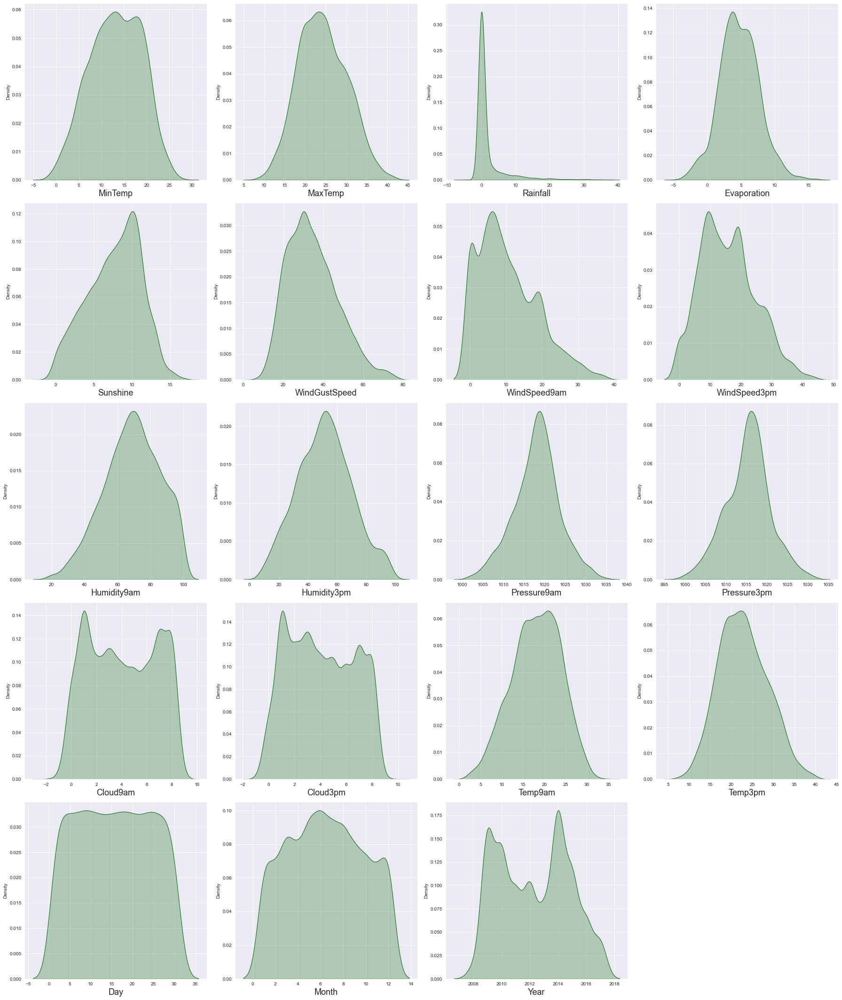

In [54]:
#Checking Skewness
plt.figure(figsize=(25,35),facecolor='white')
plotnumber=1
for column in numerical_col:
    if plotnumber<=23:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(new_df[column],color="darkgreen",hist=False,kde_kws={"shade": True})
        plt.xlabel(column,fontsize=18)
    plotnumber+=1
plt.tight_layout()

In [55]:
new_df.skew()

MinTemp         -0.137773
MaxTemp          0.197290
Rainfall         3.650157
Evaporation      0.174545
Sunshine        -0.288996
WindGustSpeed    0.601910
WindSpeed9am     0.756993
WindSpeed3pm     0.426798
Humidity9am     -0.273921
Humidity3pm      0.098996
Pressure9am     -0.109561
Pressure3pm     -0.077155
Cloud9am         0.024393
Cloud3pm         0.096084
Temp9am         -0.209469
Temp3pm          0.243698
Day              0.009663
Month            0.033661
Year             0.083311
dtype: float64

In [57]:
#Removing Skewness
skew=['Rainfall','Evaporation','WindGustSpeed','WindSpeed9am','WindSpeed3pm']
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')

new_df[skew] = scaler.fit_transform(new_df[skew].values)
new_df[skew].head()

,Rainfall,Evaporation,WindGustSpeed,WindSpeed9am,WindSpeed3pm
0,0.025505,-0.439379,0.802824,1.127813,0.930282
1,-0.488704,-0.178533,0.802824,-0.688680,0.733619
2,-0.488704,0.401421,0.934640,1.040434,1.122323
3,-0.488704,-0.308178,-0.827201,0.249136,-0.705375
4,0.264737,-0.260743,0.596992,-0.239786,0.531855


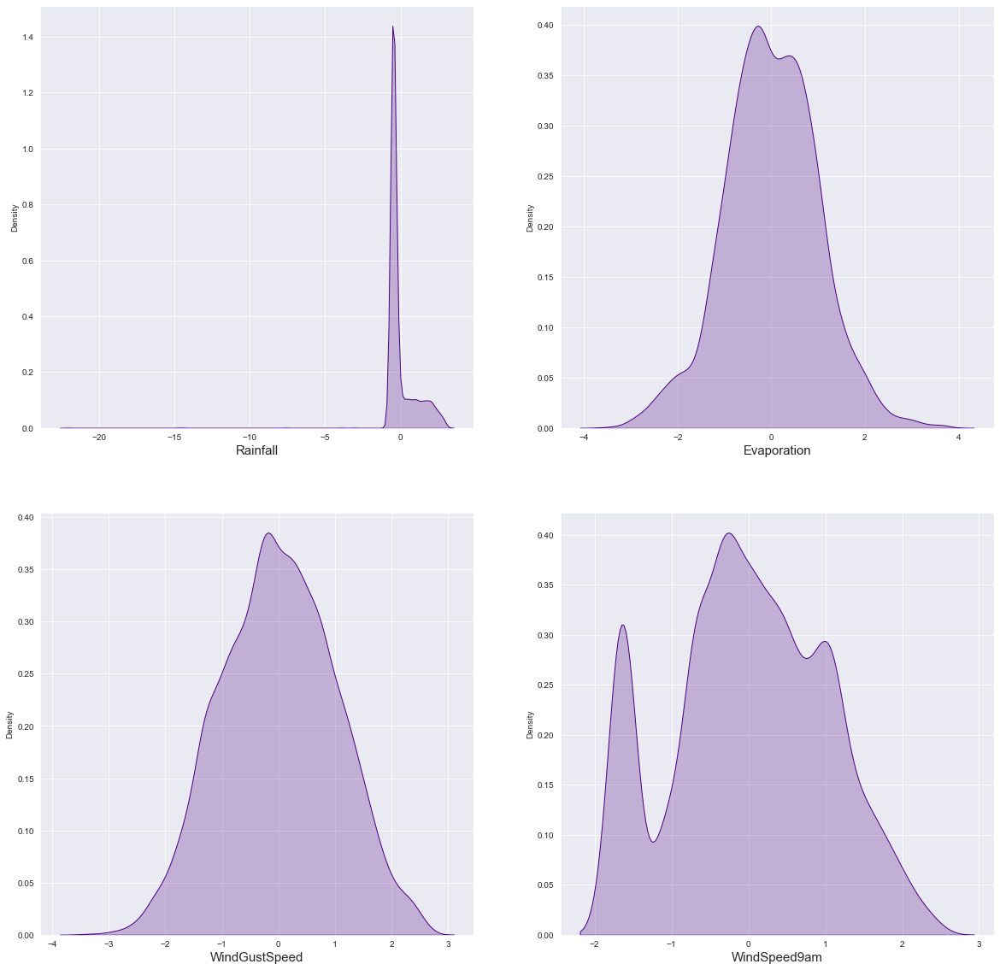

In [58]:
# Checking data distribution after removing skewness

plt.figure(figsize=(20,20), facecolor='white')
plotnumber = 1

for column in new_df[skew]:
    if plotnumber<=4:
        ax = plt.subplot(2,2,plotnumber)
        sns.distplot(new_df[column],color='indigo',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=15)
    plotnumber+=1
plt.show()

In [59]:
# Removing skewness using square root method
new_df["Rainfall"] = np.cbrt(new_df["Rainfall"])

In [60]:
new_df.skew()

MinTemp         -0.137773
MaxTemp          0.197290
Rainfall         1.115372
Evaporation      0.001951
Sunshine        -0.288996
WindGustSpeed   -0.003096
WindSpeed9am     0.001487
WindSpeed3pm    -0.009790
Humidity9am     -0.273921
Humidity3pm      0.098996
Pressure9am     -0.109561
Pressure3pm     -0.077155
Cloud9am         0.024393
Cloud3pm         0.096084
Temp9am         -0.209469
Temp3pm          0.243698
Day              0.009663
Month            0.033661
Year             0.083311
dtype: float64

In [62]:
#Encoding the categorical columns using Label Encoding Method
from sklearn.preprocessing import LabelEncoder

LE=LabelEncoder()
new_df[categorical_col]= new_df[categorical_col].apply(LE.fit_transform)

In [63]:
new_df[categorical_col]

,Location,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow
0,1,13,13,14,0,0
1,1,14,6,15,0,0
2,1,15,13,15,0,0
3,1,4,9,0,0,0
4,1,13,1,7,0,0
...,...,...,...,...,...,...
6757,0,3,3,3,0,0
6758,0,14,5,3,0,1
6759,0,15,11,12,1,1
6760,0,15,8,13,1,0


In [64]:
#Correlation between the target variable and independent variables using HEAT map
cor = new_df.corr()
cor

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
WindGustDir,1.000000,0.367967,0.393584,0.071513,0.006166,-0.147793,-0.081854,-0.069394,-0.017616,-0.048134,0.013827,0.168620,0.231925,0.147788,-0.119860,-0.111734,-0.086622,-0.052079,0.009259,-0.018267,-0.072270,-0.067763,0.000404,0.021164,-0.212247
WindDir9am,0.367967,1.000000,0.201090,0.122139,-0.007133,-0.021021,0.069061,-0.024063,0.046527,0.103681,0.006796,0.193592,0.401648,0.196421,-0.177281,-0.033417,-0.058537,-0.013349,-0.003938,0.004311,0.075152,-0.025337,-0.021223,0.017524,-0.039959
WindDir3pm,0.393584,0.201090,1.000000,0.083341,-0.017381,-0.050372,-0.143353,-0.157298,0.041917,-0.045704,-0.060204,0.025278,0.001202,-0.025634,-0.008537,-0.034395,-0.026644,0.030035,0.043943,0.032016,-0.164988,-0.160667,-0.001424,0.032329,-0.021169
RainToday,0.071513,0.122139,0.083341,1.000000,0.294971,0.010212,0.102598,-0.139564,0.672176,-0.056610,-0.295733,0.039712,0.061933,-0.010452,0.256925,0.275839,-0.032336,0.016307,0.268806,0.240204,-0.028751,-0.143006,0.001433,-0.048330,0.018636
RainTomorrow,0.006166,-0.007133,-0.017381,0.294971,1.000000,0.012833,0.096017,-0.099118,0.241047,-0.046624,-0.313694,0.078357,0.052658,-0.014179,0.200316,0.339144,-0.037336,-0.015301,0.243258,0.294422,0.004357,-0.127703,0.003060,-0.052404,0.020604
Location,-0.147793,-0.021021,-0.050372,0.010212,0.012833,1.000000,0.109190,-0.042359,0.078695,0.243115,-0.156778,0.013829,-0.018394,-0.010370,0.109831,0.188513,0.073166,0.086926,0.115216,0.143629,0.063952,-0.054065,-0.001757,-0.032383,0.542482
MinTemp,-0.081854,0.069061,-0.143353,0.102598,0.096017,0.109190,1.000000,0.739828,0.139847,0.603982,0.073398,0.292092,0.230793,0.241939,-0.114346,0.122702,-0.489516,-0.482624,0.156774,0.115432,0.905063,0.709154,0.022301,-0.204835,0.030889
MaxTemp,-0.069394,-0.024063,-0.157298,-0.139564,-0.099118,-0.042359,0.739828,1.000000,-0.188440,0.710569,0.577814,0.239686,0.100881,0.199192,-0.386030,-0.393091,-0.406983,-0.486397,-0.287213,-0.294340,0.860738,0.980235,0.013752,-0.128894,0.059236
Rainfall,-0.017616,0.046527,0.041917,0.672176,0.241047,0.078695,0.139847,-0.188440,1.000000,-0.111006,-0.430844,0.076026,0.050420,0.008219,0.408673,0.408117,-0.100667,-0.026252,0.405399,0.350738,-0.040306,-0.200009,-0.000043,-0.032950,0.035293
Evaporation,-0.048134,0.103681,-0.045704,-0.056610,-0.046624,0.243115,0.603982,0.710569,-0.111006,1.000000,0.441729,0.422828,0.282206,0.300754,-0.492327,-0.334765,-0.336598,-0.350391,-0.173177,-0.230384,0.695258,0.689767,0.003852,0.020311,0.379585


<AxesSubplot:>

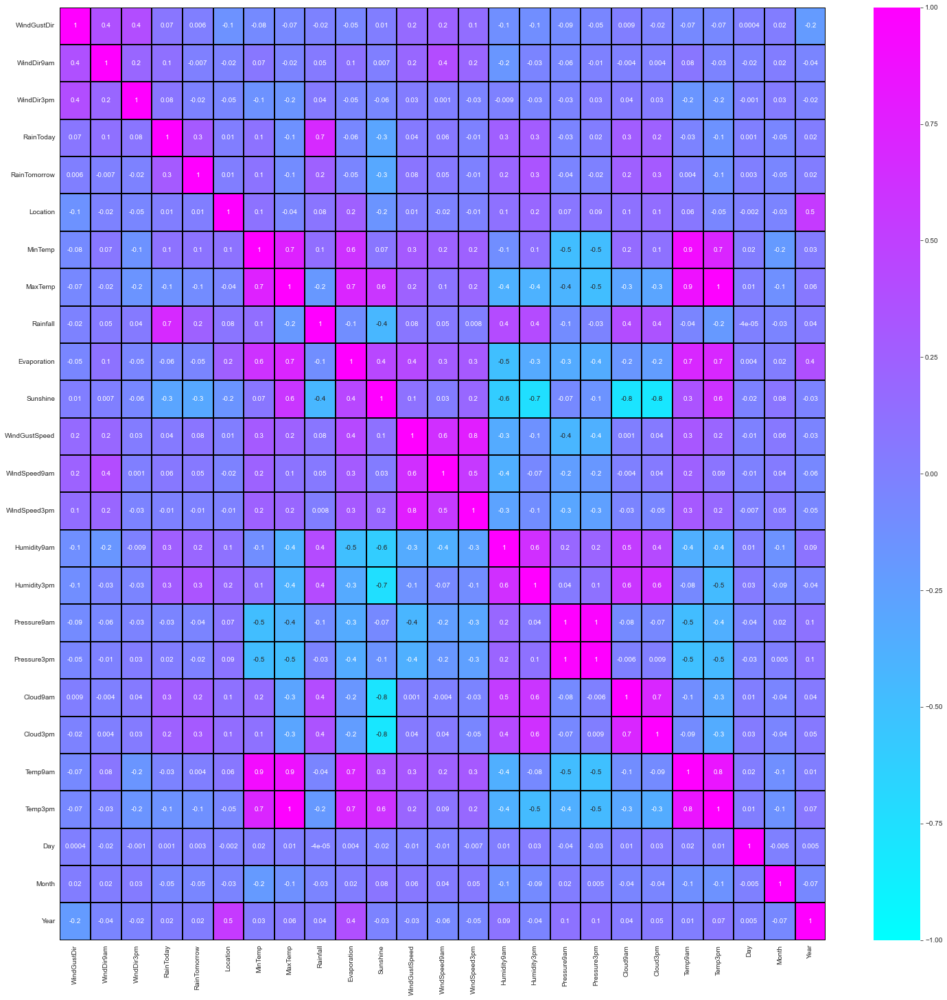

In [65]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,25))
sns.heatmap(new_df.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cool")

In [66]:
#Standard Scaler

#Separate Label and Features
x=new_df.drop('RainTomorrow',axis=1)
y=new_df.RainTomorrow
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()


,WindGustDir,WindDir9am,WindDir3pm,RainToday,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.247965,1.213389,1.541063,-0.560882,-1.379334,0.048488,-0.226612,0.718939,-0.439379,-0.154832,0.802824,1.127813,0.930282,0.124237,-1.588149,-1.883671,-1.502182,1.479615,0.327698,-0.202854,-0.185536,-1.668284,1.667302,-1.743795
1,1.441737,-0.358897,1.779808,-0.560882,-1.379334,-1.001527,0.145232,-0.613127,-0.178533,1.435521,0.802824,-0.688680,0.733619,-1.471736,-1.426422,-1.357451,-1.375007,-1.110178,-1.049117,-0.150355,0.247241,-1.554771,1.667302,-1.743795
2,1.635509,1.213389,1.779808,-0.560882,-1.379334,-0.039013,0.246644,-0.613127,0.401421,1.260313,0.934640,1.040434,1.122323,-1.826396,-1.156876,-1.901817,-1.211498,-0.682731,-0.828466,0.514633,0.056819,-1.441258,1.667302,-1.743795
3,-0.495982,0.314940,-1.801369,-0.560882,-1.379334,-0.686522,0.635391,-0.613127,-0.308178,1.569545,-0.827201,0.249136,-0.705375,-1.412625,-1.911604,-0.087263,-0.466621,-1.348008,-1.300868,0.007143,0.628084,-1.327745,1.667302,-1.743795
4,1.247965,-1.481959,-0.130153,-0.560882,-1.379334,0.765999,1.362178,1.147043,-0.260743,-0.270022,0.596992,-0.239786,0.531855,0.774448,-0.995149,-1.321159,-1.702027,1.102344,1.584544,-0.045357,1.182039,-1.214232,1.667302,-1.743795


In [67]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.473704,WindGustDir
1,1.398929,WindDir9am
2,1.305494,WindDir3pm
3,1.910129,RainToday
4,1.658136,Location
5,12.657006,MinTemp
6,38.583443,MaxTemp
7,2.347983,Rainfall
8,5.193600,Evaporation
9,10.521253,Sunshine


In [68]:
#Droping Temp3pm as it has highest VIF values
x.drop('Temp3pm',axis=1,inplace=True)
#Again Check VIF score
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.473365,WindGustDir
1,1.398028,WindDir9am
2,1.305147,WindDir3pm
3,1.909899,RainToday
4,1.655637,Location
5,12.487159,MinTemp
6,13.694543,MaxTemp
7,2.347975,Rainfall
8,5.191317,Evaporation
9,10.506022,Sunshine


In [69]:
x.drop('Pressure3pm',axis=1,inplace=True)

In [70]:
x.drop('Temp9am',axis=1,inplace=True)

In [71]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.473017,WindGustDir
1,1.391771,WindDir9am
2,1.273615,WindDir3pm
3,1.903071,RainToday
4,1.638519,Location
5,6.564714,MinTemp
6,8.443891,MaxTemp
7,2.304893,Rainfall
8,5.094629,Evaporation
9,9.950082,Sunshine


In [72]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x, y = SM.fit_resample(x,y)

In [73]:
y.value_counts()

0    3665
1    3665
Name: RainTomorrow, dtype: int64

# Model Building

In [74]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    DTC = RandomForestClassifier()
    DTC.fit(x_train, y_train)
    pred = DTC.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8840381991814461  on Random_state  80


In [75]:
# Creating train_test split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [76]:
# Checking accuracy for Random Forest Classifier
RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)

# Prediction
predRFC = RFC.predict(x_test)
rfc=accuracy_score(y_test, predRFC)
print(rfc)
print(confusion_matrix(y_test, predRFC))
print(classification_report(y_test,predRFC))

0.8799454297407913
[[977 142]
 [122 958]]
              precision    recall  f1-score   support

           0       0.89      0.87      0.88      1119
           1       0.87      0.89      0.88      1080

    accuracy                           0.88      2199
   macro avg       0.88      0.88      0.88      2199
weighted avg       0.88      0.88      0.88      2199



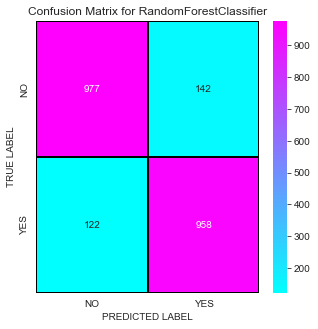

In [78]:
#confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predRFC)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

In [79]:
# Checking accuracy for SVM
svc = SVC()
svc.fit(x_train,y_train)

# Prediction
predsvc = svc.predict(x_test)
sv=accuracy_score(y_test, predsvc)
print(sv)
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test,predsvc))

0.814006366530241
[[898 221]
 [188 892]]
              precision    recall  f1-score   support

           0       0.83      0.80      0.81      1119
           1       0.80      0.83      0.81      1080

    accuracy                           0.81      2199
   macro avg       0.81      0.81      0.81      2199
weighted avg       0.81      0.81      0.81      2199



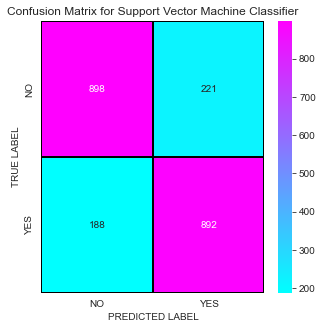

In [80]:
#confusion matrix for SVM
cm = confusion_matrix(y_test,predsvc)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Support Vector Machine Classifier')
plt.show()

In [81]:
# Checking accuracy for Gradient Boosting Classifier
GB = GradientBoostingClassifier()
GB.fit(x_train,y_train)

# Prediction
predGB = GB.predict(x_test)

gb=accuracy_score(y_test, predGB)
print(gb)
print(confusion_matrix(y_test, predGB))
print(classification_report(y_test,predGB))

0.8221919054115507
[[941 178]
 [213 867]]
              precision    recall  f1-score   support

           0       0.82      0.84      0.83      1119
           1       0.83      0.80      0.82      1080

    accuracy                           0.82      2199
   macro avg       0.82      0.82      0.82      2199
weighted avg       0.82      0.82      0.82      2199



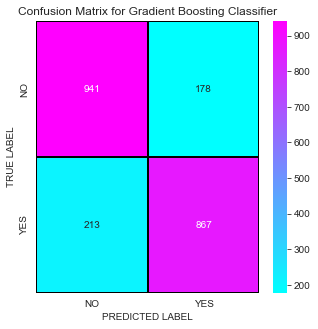

In [82]:
# Lets plot confusion matrix for Gradient Boosting Classifier
cm = confusion_matrix(y_test,predGB)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="cool",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

# Cross Validation Score

In [83]:
rf=cross_val_score(RFC,x,y,cv=5).mean()
sv_cv=cross_val_score(svc,x,y,cv=5).mean()
gb_cv=cross_val_score(GB,x,y,cv=5).mean()
print(gb_cv)
print(sv_cv)
print(rf)

0.48253751705320597
0.5971350613915416
0.581718963165075


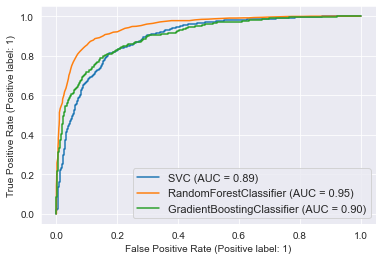

In [87]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 


disp=plot_roc_curve(svc, x_test, y_test)   # ax_=Axes with confusion matrix
plot_roc_curve(RFC, x_test, y_test, ax=disp.ax_)

plot_roc_curve(GB, x_test, y_test, ax=disp.ax_)


plt.legend(prop={'size':11}, loc='lower right')

plt.show()

# Final Model

In [88]:
FinalModel = SVC(C= 1.5, gamma='scale', kernel= 'rbf', random_state=100)
FinalModel.fit(x_train, y_train)
pred = FinalModel.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

81.80991359708959


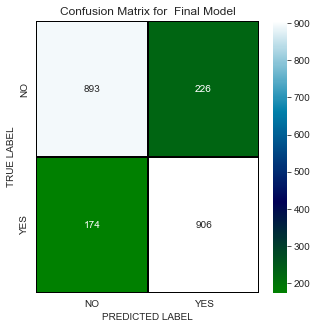

In [89]:
#confusion matrix for  FinalModel
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["NO","YES"]
y_axis_labels = ["NO","YES"]

f , ax = plt.subplots(figsize=(5,5))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="ocean",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show()

# Saving the Model

In [90]:
import joblib
joblib.dump(FinalModel,"RainClassification.pkl")


['RainClassification.pkl']

In [91]:
# Loading the saved model
model=joblib.load("RainClassification.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([1, 1, 0, ..., 1, 1, 1])

In [92]:
a=np.array(y_test)
Class_Result=pd.DataFrame({'Original':a,'Prediction':prediction})
Class_Result

,Original,Prediction
0,1,1
1,1,1
2,0,0
3,0,0
4,0,0
...,...,...
2194,1,1
2195,0,0
2196,1,1
2197,1,1


# Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there.

<AxesSubplot:>

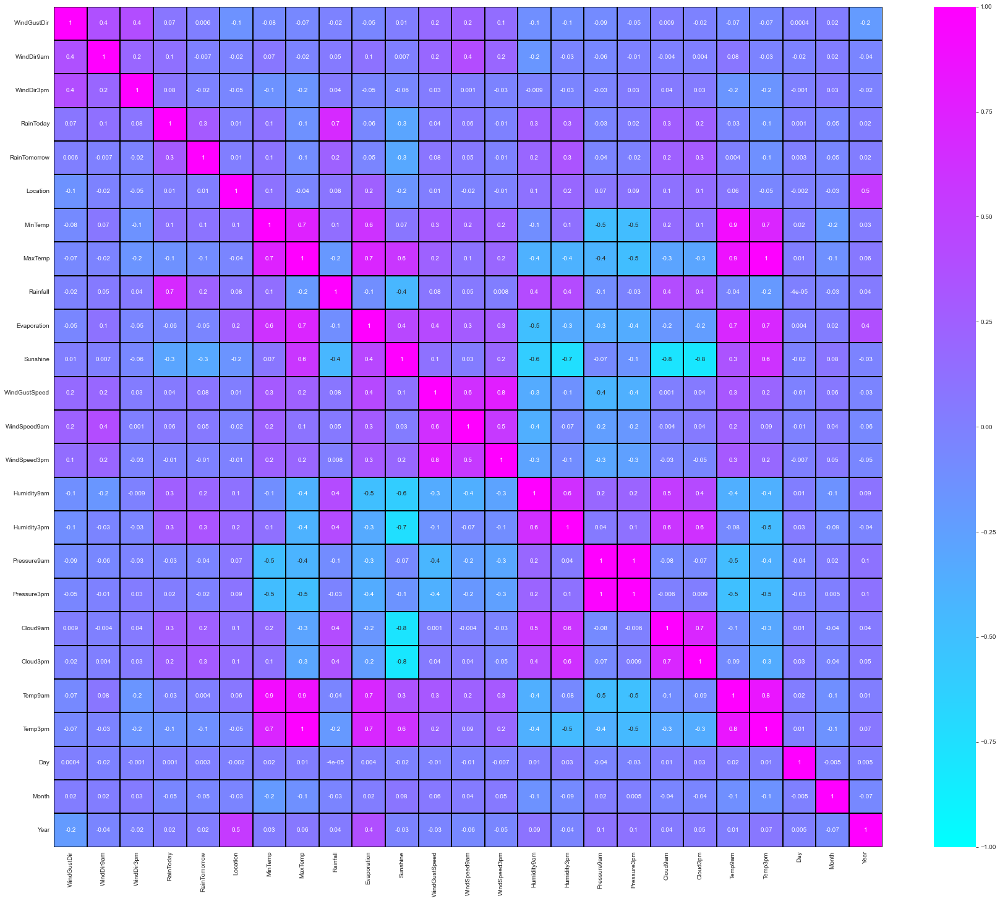

In [94]:
#relation with Rainfall
plt.figure(figsize=(30,25))
sns.heatmap(cor,linewidths=.1,vmin=-1, vmax=1, fmt='.1g',linecolor="black", annot = True, annot_kws={'size':10},cmap="cool")


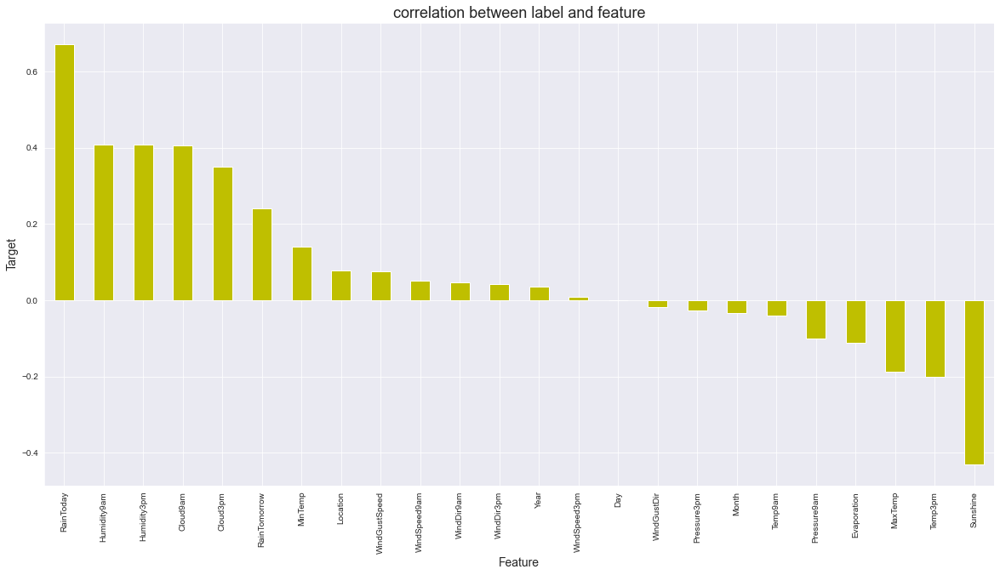

In [95]:
#correlation between label and features using bar plot
plt.figure(figsize=(20,10))
new_df.corr()['Rainfall'].sort_values(ascending=False).drop(['Rainfall']).plot(kind='bar',color='y')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('Target',fontsize=14)
plt.title('correlation between label and feature',fontsize=18)
plt.show()

In [96]:
#Separation of the features and label 
x = new_df.drop("Rainfall", axis=1)
y = new_df["Rainfall"]

In [97]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x.head()

,WindGustDir,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
0,1.247965,1.213389,1.541063,-0.560882,-0.565975,-1.379334,0.048488,-0.226612,-0.439379,-0.154832,0.802824,1.127813,0.930282,0.124237,-1.588149,-1.883671,-1.502182,1.479615,0.327698,-0.202854,-0.185536,-1.668284,1.667302,-1.743795
1,1.441737,-0.358897,1.779808,-0.560882,-0.565975,-1.379334,-1.001527,0.145232,-0.178533,1.435521,0.802824,-0.688680,0.733619,-1.471736,-1.426422,-1.357451,-1.375007,-1.110178,-1.049117,-0.150355,0.247241,-1.554771,1.667302,-1.743795
2,1.635509,1.213389,1.779808,-0.560882,-0.565975,-1.379334,-0.039013,0.246644,0.401421,1.260313,0.934640,1.040434,1.122323,-1.826396,-1.156876,-1.901817,-1.211498,-0.682731,-0.828466,0.514633,0.056819,-1.441258,1.667302,-1.743795
3,-0.495982,0.314940,-1.801369,-0.560882,-0.565975,-1.379334,-0.686522,0.635391,-0.308178,1.569545,-0.827201,0.249136,-0.705375,-1.412625,-1.911604,-0.087263,-0.466621,-1.348008,-1.300868,0.007143,0.628084,-1.327745,1.667302,-1.743795
4,1.247965,-1.481959,-0.130153,-0.560882,-0.565975,-1.379334,0.765999,1.362178,-0.260743,-0.270022,0.596992,-0.239786,0.531855,0.774448,-0.995149,-1.321159,-1.702027,1.102344,1.584544,-0.045357,1.182039,-1.214232,1.667302,-1.743795


In [98]:
# Finding VIF in each scaled column
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.470121,WindGustDir
1,1.401188,WindDir9am
2,1.307345,WindDir3pm
3,1.260449,RainToday
4,1.252168,RainTomorrow
5,1.671322,Location
6,12.633757,MinTemp
7,38.556041,MaxTemp
8,5.193692,Evaporation
9,10.519611,Sunshine


In [99]:
x.drop('Temp3pm',axis=1,inplace=True)
x.drop('Temp9am',axis=1,inplace=True)
x.drop('Pressure3pm',axis=1,inplace=True)

In [100]:
vif = pd.DataFrame()#Again check the value of VIF
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.469616,WindGustDir
1,1.394378,WindDir9am
2,1.275800,WindDir3pm
3,1.258677,RainToday
4,1.250594,RainTomorrow
5,1.651852,Location
6,6.478599,MinTemp
7,8.378407,MaxTemp
8,5.097125,Evaporation
9,9.978929,Sunshine


# Model Building

In [101]:
#Finding best random state
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    RFG = RandomForestRegressor()
    RFG.fit(x_train, y_train)
    pred = RFG.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.7528695479216946  on Random_state  156


In [102]:
train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS) 

In [106]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor

In [107]:
knn=KNN()
knn.fit(x_train,y_train)

# prediction
predknn=knn.predict(x_test)
print('R2_Score:',r2_score(y_test,predknn))
print('MAE:',mean_absolute_error(y_test, predknn))
print('MSE:',mean_squared_error(y_test, predknn))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predknn)))
# Checking cv score 
print(cross_val_score(knn,x,y,cv=5).mean())

R2_Score: -0.11423532875286124
MAE: 0.6887272634996655
MSE: 0.7567229620768163
RMSE: 0.8698982481168797
0.39146668091620296


In [103]:
# Checking R2 score for Random Forest Regressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)

# prediction
predRFR=RFR.predict(x_test)
print('R2_Score:',r2_score(y_test,predRFR))
print('MAE:',mean_absolute_error(y_test, predRFR))
print('MSE:',mean_squared_error(y_test, predRFR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predRFR)))
# Checking cv score 
print(cross_val_score(RFR,x,y,cv=5).mean())

R2_Score: -0.24445916981591354
MAE: 0.7134045312522483
MSE: 0.845163319512396
RMSE: 0.9193276453541447
0.4633098177772199


In [108]:
GB=GradientBoostingRegressor()
GB.fit(x_train,y_train)

# prediction
predGB=GB.predict(x_test)
print('R2_Score:',r2_score(y_test,predGB))
print('MAE:',mean_absolute_error(y_test, predGB))
print('MSE:',mean_squared_error(y_test, predGB))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predGB)))
# Checking cv score 

print(cross_val_score(GB,x,y,cv=5).mean())

R2_Score: 0.003784059007804208
MAE: 0.699766361860361
MSE: 0.6765711499917485
RMSE: 0.8225394519363485
0.44075848475564017


In [109]:
# Checking R2 score for BaggingRegressor
from sklearn.ensemble import BaggingRegressor
BR=BaggingRegressor()
BR.fit(x_train,y_train)

# prediction
predBR=BR.predict(x_test)
print('R2_Score:',r2_score(y_test,predBR))
print('MAE:',mean_absolute_error(y_test, predBR))
print('MSE:',mean_squared_error(y_test, predBR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predBR)))
# Checking cv score
print(cross_val_score(BR,x,y,cv=5).mean())

R2_Score: -0.2942550341941932
MAE: 0.7149613974641807
MSE: 0.87898173562175
RMSE: 0.9375402581338841
0.43798356632145696


In [110]:
ABR=AdaBoostRegressor()

ABR.fit(x_train,y_train)
# prediction
predABR=ABR.predict(x_test)
print('R2_Score:',r2_score(y_test,predABR))
print('MAE:',mean_absolute_error(y_test, predABR))
print('MSE:',mean_squared_error(y_test, predABR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predABR)))
# Checking cv score
print(cross_val_score(ABR,x,y,cv=5).mean())

R2_Score: -0.29575635586237925
MAE: 0.920887352888144
MSE: 0.8800013448106377
RMSE: 0.9380838687508903
0.21293903731494432


AdaboostRegressor is Best Algorithm, least differance between r2 score and CVR score

# Hyper parameter tuning

In [111]:
parameter={'n_estimators':[1,3,4,5],
          'learning_rate':[.1,1,.3,.5],
          'loss' : ['linear', 'square', 'exponential'],
          'random_state':[100,150,200,250]}

In [112]:
GCV=GridSearchCV(AdaBoostRegressor(),parameter,cv=4)

In [113]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=4, estimator=AdaBoostRegressor(),
             param_grid={'learning_rate': [0.1, 1, 0.3, 0.5],
                         'loss': ['linear', 'square', 'exponential'],
                         'n_estimators': [1, 3, 4, 5],
                         'random_state': [100, 150, 200, 250]})

In [114]:
GCV.best_params_

{'learning_rate': 0.1,
 'loss': 'linear',
 'n_estimators': 5,
 'random_state': 150}

In [115]:
Rainfall_model = AdaBoostRegressor(learning_rate= 1, loss= 'exponential',n_estimators= 3,random_state=100)
Rainfall_model.fit(x_train, y_train)
pred = Rainfall_model.predict(x_test)
print("RMSE value:",np.sqrt(mean_squared_error(y_test, pred)))
print('R2_Score:',r2_score(y_test,pred)*100)

RMSE value: 0.8108440634821686
R2_Score: 3.1912316651457995


In [116]:
# Saving the model
import joblib
joblib.dump(Rainfall_model,"RainfallRegressor.pkl")

['RainfallRegressor.pkl']

In [117]:
# Loading the saved model
model=joblib.load("RainfallRegressor.pkl")

#Prediction
prediction = model.predict(x_test)
a = np.array(y_test)
df_final = pd.DataFrame({"Original":a,"Predicted":prediction},index=range(len(a)))
df_final

,Original,Predicted
0,1.212336,-0.259551
1,-0.787678,-0.111715
2,1.261427,-0.111715
3,-0.787678,-0.321523
4,-0.787678,-0.111715
...,...,...
1447,1.225305,-0.111715
1448,-0.787678,-0.321523
1449,0.533916,-0.111715
1450,-0.787678,-0.272840
